<a href="https://colab.research.google.com/github/YWchris/Effect-of-heterogeneity-and-cluster-analysis/blob/main/Chest_X_ray_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Here are the explanations of the steps in this nootebook:
1. The dataset used is the Chest X-ray images, which are from https://www.kaggle.com/datasets/nih-chest-xrays/sample
2. The sample images are saved to Google drive

3. For all of the images, only images with labels with Cardiomegaly or No Findings are selected

4. Before data splitting, making the number of Cardiomegaly images = the number of normal images

5. Train-Test split

6. Data Augmentation on images in the training set

6. Train a binary classifier on the training images

7. Use the trained binary classifier(remove the last layer) to extract features from the training images

8. K-means clustering on the training set

9. For images in each of the cluster, train a binary CNN, test the performance of the CNN using the testing set

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import preprocess_data

NameError: name 'prepr' is not defined

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import pandas as pd
df = pd.read_csv('gdrive/My Drive/Chest X-Ray NIH/sample_labels.csv')
len(df)

5606

In [ ]:
df.head(10)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,0.139
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,0.168
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,0.143
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168
5,00000040_003.png,Consolidation|Mass,3,40,068Y,M,PA,2500,2048,0.168,0.168
6,00000042_002.png,No Finding,2,42,071Y,M,AP,3056,2544,0.139,0.139
7,00000057_001.png,No Finding,1,57,071Y,M,AP,3056,2544,0.139,0.139
8,00000061_002.png,Effusion,2,61,077Y,M,PA,2992,2991,0.143,0.143
9,00000061_019.png,No Finding,19,61,077Y,M,AP,3056,2544,0.139,0.139


In [ ]:
data2 = df[df['Finding Labels'].str.contains('Cardiomegaly')]
print(len(data2))
data3 = df.loc[(df['Finding Labels'] == 'No Finding')]
data3 = data3.iloc[:141]
print(len(data3))
#frame_data = [data2, data3]
#data_w = pd.concat(frame_data)
#data_w = data_w.sample(frac = 1, random_state=42)
#len(data_w)
#data_w.head()
data2.head()

141
141


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168
19,00000116_013.png,Cardiomegaly|Consolidation,13,116,075Y,F,AP,2500,2048,0.168,0.168
21,00000116_032.png,Cardiomegaly|Consolidation,32,116,075Y,F,AP,2500,2048,0.168,0.168
22,00000116_040.png,Cardiomegaly|Consolidation,40,116,075Y,F,AP,2500,2048,0.168,0.168


In [ ]:
data_1 = data3.loc[(data3['Finding Labels'] == 'No Finding') & (data3['Patient Gender'] == 'M')]
data_2 = data3.loc[(data3['Finding Labels'] == 'No Finding') & (data3['Patient Gender'] == 'F')]
#data_1 = data_1.iloc[:422]
#data_2 = data_2.iloc[:422]
print(len(data_1), len(data_2))

data_3 = data2.loc[(data2['Finding Labels'].str.contains('Cardiomegaly')) & (data2['Patient Gender'] == 'M')]
data_4 = data2.loc[(data2['Finding Labels'].str.contains('Cardiomegaly')) & (data2['Patient Gender'] == 'F')]
#data_3 = data_3.iloc[:422]
print(len(data_3), len(data_4))
frame_data = [data_1, data_2, data_3, data_4]
dataT = pd.concat(frame_data)
dataT = dataT.sample(frac = 1, random_state=42)
print(len(dataT))
dataT.head()

68 73
68 73
282


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
99,00000554_000.png,No Finding,0,554,055Y,F,PA,2726,2669,0.143,0.143
105,00000598_000.png,No Finding,0,598,078Y,F,PA,2048,2500,0.168,0.168
3190,00015693_007.png,Cardiomegaly|Edema,7,15693,052Y,M,AP,2500,2048,0.168,0.168
200,00001101_022.png,No Finding,22,1101,045Y,F,AP,3056,2544,0.139,0.139
4103,00020213_045.png,Atelectasis|Cardiomegaly|Consolidation|Effusio...,45,20213,072Y,F,AP,3056,2544,0.139,0.139


In [ ]:
dataT['Result'] = dataT['Finding Labels'].apply(lambda x: 0 if 'No Finding' in x else 1)
dataT.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y,Result
99,00000554_000.png,No Finding,0,554,055Y,F,PA,2726,2669,0.143,0.143,0
105,00000598_000.png,No Finding,0,598,078Y,F,PA,2048,2500,0.168,0.168,0
3190,00015693_007.png,Cardiomegaly|Edema,7,15693,052Y,M,AP,2500,2048,0.168,0.168,1
200,00001101_022.png,No Finding,22,1101,045Y,F,AP,3056,2544,0.139,0.139,0
4103,00020213_045.png,Atelectasis|Cardiomegaly|Consolidation|Effusio...,45,20213,072Y,F,AP,3056,2544,0.139,0.139,1


In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(dataT,
                                   test_size = 0.20,
                                   random_state = 2023,
                                   stratify = dataT[['Result']])

In [ ]:
print(len(train_df), len(test_df))

225 57


In [ ]:
train_e = train_df.loc[(train_df["Result"] == 1)]["Image Index"].values
train_n = train_df.loc[(train_df["Result"] == 0)]["Image Index"].values

In [ ]:
test_e = test_df.loc[(test_df["Result"] == 1)]["Image Index"].values
test_n = test_df.loc[(test_df["Result"] == 0)]["Image Index"].values

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader
REQUIRES_PYTHON = '>=3.5.0'
VERSION = '0.1.0'
from torch import optim, nn
from torchvision import models, transforms

In [ ]:
data_path='/content/drive/MyDrive/Chest X-Ray NIH/sample/images'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("On which device we are on:{}".format(device))

from google.colab import drive
drive.mount('/content/drive')

from pandas.core.common import random_state
import cv2
import glob
from PIL import Image
image_size=224
labels = []
dataset = []
random.seed(1)
def create_dataset(image_category,label):
    for img in tqdm(image_category):
        image_path = os.path.join(data_path,img)
        try:
            image = cv2.imread(image_path,cv2.IMREAD_COLOR)
            image = cv2.resize(image,(image_size,image_size))
        except:
            continue

        dataset.append([image,label])
    random.shuffle(dataset)
    return dataset

dataset = create_dataset(train_e,1)

dataset = create_dataset(train_n,0)
x = np.array([i[0] for i in dataset]).reshape(-1,image_size,image_size,3) #features
y = np.array([i[1] for i in dataset]) #labels
len(x)
len(y)

On which device we are on:cpu
Mounted at /content/drive


  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

225

In [ ]:
data_path='/content/drive/MyDrive/Chest X-Ray NIH/sample/images'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("On which device we are on:{}".format(device))

from google.colab import drive
drive.mount('/content/drive')

from pandas.core.common import random_state
import cv2
import glob
image_size=224
labels = []
dataset = []
random.seed(1)
def create_dataset(image_category,label):
    for img in tqdm(image_category):
        image_path = os.path.join(data_path,img)
        try:
            image = cv2.imread(image_path,cv2.IMREAD_COLOR)
            image = cv2.resize(image,(image_size,image_size))
        except:
            continue

        dataset.append([np.array(image),np.array(label)])
    random.shuffle(dataset)
    return dataset

dataset = create_dataset(test_e,1)

dataset = create_dataset(test_n,0)

x_testall = np.array([i[0] for i in dataset]).reshape(-1,image_size,image_size,3) #features
y_testall = np.array([i[1] for i in dataset]) #labels
len(x_testall)
len(y_testall)

On which device we are on:cpu
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


  0%|          | 0/29 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

57

In [ ]:
!pip uninstall tensorflow -y
!pip install tensorflow==2.9.0

Found existing installation: tensorflow 2.9.0
Uninstalling tensorflow-2.9.0:
  Successfully uninstalled tensorflow-2.9.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached tensorflow-2.9.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (511.7 MB)


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

datagen.fit(x)

In [ ]:
# Augmentation: Training data
batch_size = 8
num_augmented = 225

augmented_images = np.zeros((num_augmented, image_size, image_size, 3))
for i in range(num_augmented):
    img = x[i % len(x)]  # select an image from the original dataset
    augmented_images[i] = datagen.random_transform(img)

x_aug = np.concatenate((x, augmented_images), axis=0)
y_aug = np.concatenate((y, y[:num_augmented]), axis=0)
y_aug[:len(y)] = y  # repeat the original output data to match the number of samples in x_aug


In [ ]:
# Augmentation: Testing data
batch_size = 8
num_augmented = 57

augmented_images = np.zeros((num_augmented, image_size, image_size, 3))
for i in range(num_augmented):
    img = x_testall[i % len(x_testall)]  # select an image from the original dataset
    augmented_images[i] = datagen.random_transform(img)

x_aug_test = np.concatenate((x_testall, augmented_images), axis=0)
y_aug_test = np.concatenate((y_testall, y_testall[:num_augmented]), axis=0)
y_aug_test[:len(y_testall)] = y_testall  # repeat the original output data to match the number of samples in x_aug

In [ ]:
print(len(x_aug), len(y_aug))

450 450


In [ ]:
print(len(x_aug_test), len(y_aug_test))

114 114


In [ ]:
from keras.applications.efficientnet import EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

for layer in efficientnet.layers:
    layer.trainable = False

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Flatten, Dense

basemodel = Sequential()
basemodel.add(efficientnet)
basemodel.add(Flatten())
basemodel.add(Dense(1,activation="sigmoid"))
basemodel.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])

from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("c0_efficientnet.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor="val_accuracy", patience=10, verbose=1, mode='auto', restore_best_weights=True)
history2 = basemodel.fit(x_aug, y_aug, batch_size =8, epochs=30, validation_data=(x_testall, y_testall), verbose=1, callbacks = [checkpoint, earlystop])

Epoch 1/30
57/57 [==============================] - ETA: 0s - loss: 1.4796 - accuracy: 0.6289
Epoch 1: val_accuracy improved from -inf to 0.71930, saving model to c0_efficientnet.h5
57/57 [==============================] - 78s 981ms/step - loss: 1.4796 - accuracy: 0.6289 - val_loss: 0.8694 - val_accuracy: 0.7193
Epoch 2/30
57/57 [==============================] - ETA: 0s - loss: 0.4358 - accuracy: 0.8756
Epoch 2: val_accuracy improved from 0.71930 to 0.82456, saving model to c0_efficientnet.h5
57/57 [==============================] - 43s 766ms/step - loss: 0.4358 - accuracy: 0.8756 - val_loss: 0.9323 - val_accuracy: 0.8246
Epoch 3/30
57/57 [==============================] - ETA: 0s - loss: 0.4510 - accuracy: 0.8822
Epoch 3: val_accuracy did not improve from 0.82456
57/57 [==============================] - 44s 778ms/step - loss: 0.4510 - accuracy: 0.8822 - val_loss: 1.3030 - val_accuracy: 0.6491
Epoch 4/30
57/57 [==============================] - ETA: 0s - loss: 0.0981 - accuracy: 0.966

2/2 [==============================] - 8s 3s/step
Accuracy: 82.46%
AUC Score: 0.87
Sensitivity: 93.10%
Specificity: 71.43%


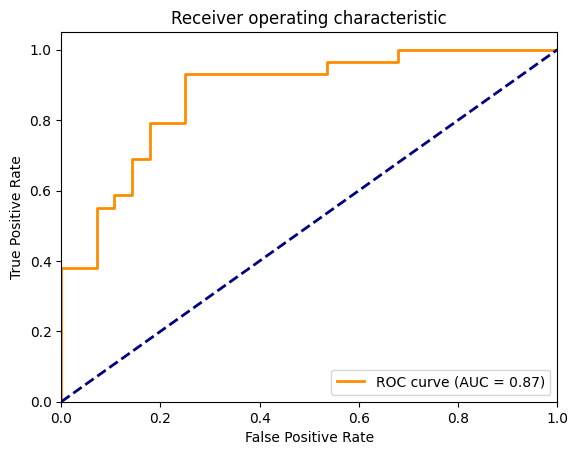

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = basemodel.predict(x_testall)

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_testall, predictions)

# Compute the AUC score
auc_score = roc_auc_score(y_testall, predictions)

# Print the performance metrics
print("Accuracy: {:.2f}%".format(accuracy_score(y_testall, np.round(predictions)) * 100))
print("AUC Score: {:.2f}".format(auc_score))
tn, fp, fn, tp = confusion_matrix(y_testall, np.round(predictions)).ravel()
print("Sensitivity: {:.2f}%".format(tp / (tp + fn) * 100))
print("Specificity: {:.2f}%".format(tn / (tn + fp) * 100))

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Feature extractor
from keras.models import Model

# Remove the last layer (Dense layer)
feature_extractor = Model(inputs=basemodel.input, outputs=basemodel.layers[-2].output)

# Extract features from the data
features = feature_extractor.predict(x_aug)

15/15 [==============================] - 43s 3s/step


In [ ]:
features_df = pd.DataFrame(features.reshape(features.shape[0], -1))
features_df.shape

(450, 62720)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%config InlineBackend.figure_format='retina'

In [ ]:
test_features = feature_extractor.predict(x_testall)
test_features_df = pd.DataFrame(test_features.reshape(test_features.shape[0], -1))
len(test_features_df)

2/2 [==============================] - 8s 3s/step


57

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=4)
cluster_labels = kmeans.fit_predict(features_df)
test_cluster_labels = kmeans.predict(test_features_df)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Axes: >

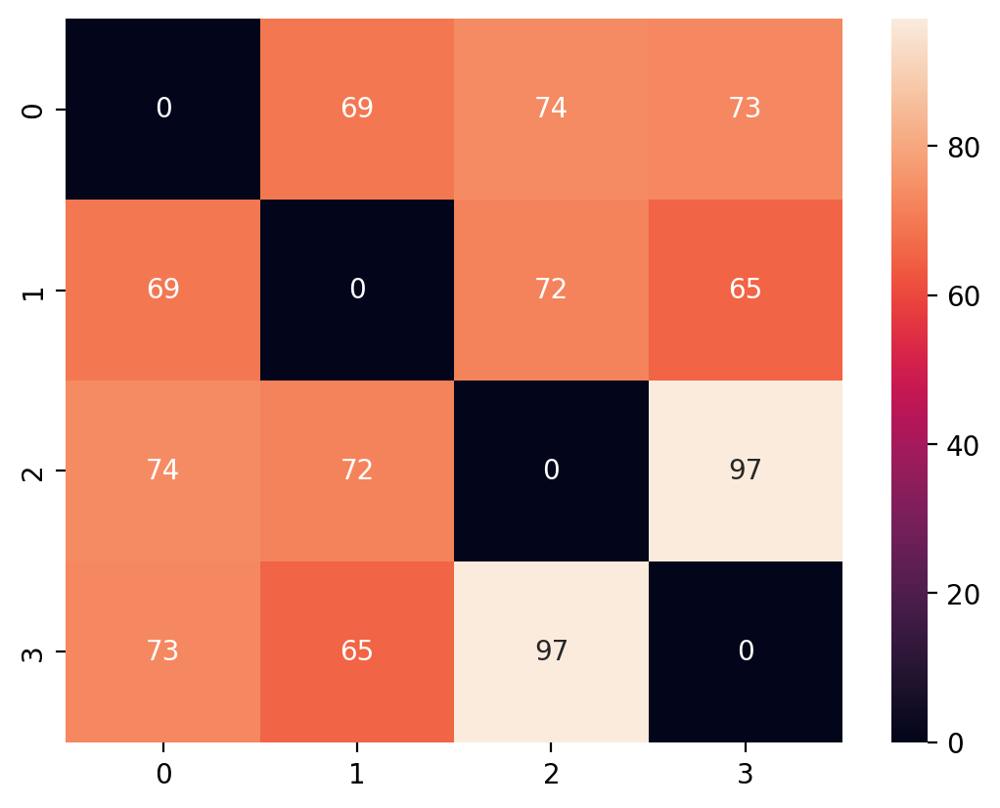

In [ ]:
# get centroids and distance matrix
import seaborn as sns
k =4
centroids = kmeans.cluster_centers_
dist_matrix = np.zeros((k, k))
for i in range(k):
    for j in range(i+1, k):
        dist_matrix[i, j] = np.linalg.norm(centroids[i] - centroids[j])
        dist_matrix[j, i] = dist_matrix[i, j]

# plot heatmap of distance matrix
sns.heatmap(dist_matrix, annot=True)

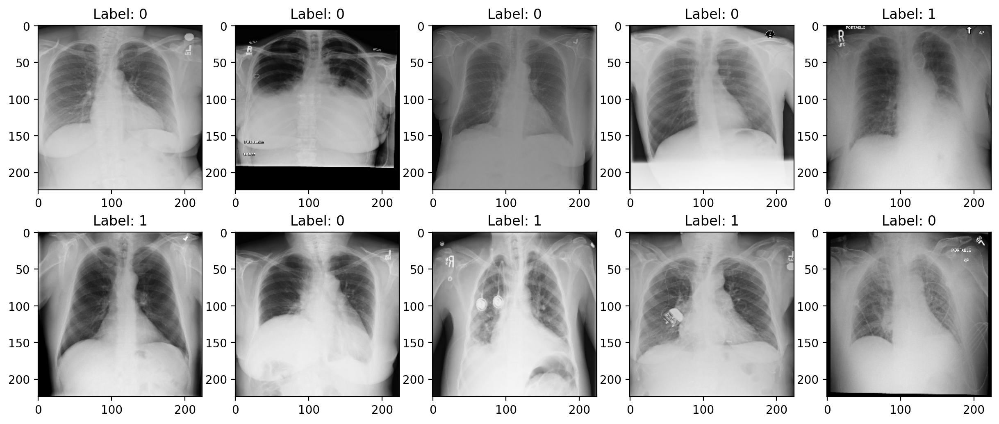

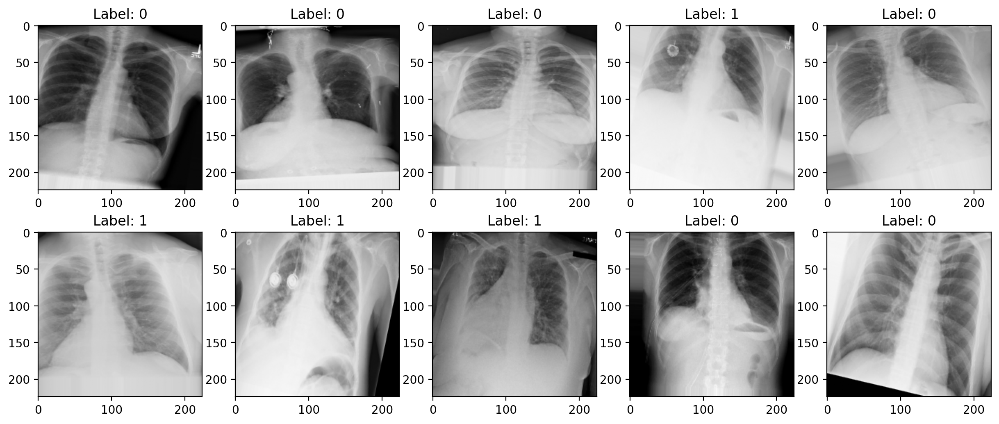

In [ ]:
import matplotlib.pyplot as plt

# get the indices of images in the first cluster
cluster1_indices = np.where(cluster_labels == 0)[0]

# plot the images in the first cluster
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(cluster1_indices[:10]):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster1_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

In [ ]:
c1_num_label_1 = np.count_nonzero(y_aug[cluster1_indices] == 1)

print(f"There are {c1_num_label_1} images labeled 1 in cluster 1.")

c1_num_label_0 = np.count_nonzero(y_aug[cluster1_indices] == 0)

print(f"There are {c1_num_label_0} images labeled 0 in cluster 1.")

There are 42 images labeled 1 in cluster 1.
There are 54 images labeled 0 in cluster 1.


In [ ]:
from scipy.spatial.distance import pdist, squareform
distances = pdist(features_df.iloc[cluster1_indices])
distance_matrix = squareform(distances)

# calculate average intra-cluster distance
intra_cluster_distance = np.mean(distance_matrix)

print("Average intra-cluster distance:", intra_cluster_distance)

Average intra-cluster distance: 239.0167496209047


In [ ]:
cluster1_indices

array([  7,  11,  14,  25,  50, 113, 122, 139, 157, 176, 229, 230, 231,
       232, 234, 236, 237, 239, 241, 243, 244, 246, 249, 254, 256, 262,
       265, 268, 269, 271, 272, 275, 279, 285, 287, 289, 290, 292, 296,
       298, 300, 301, 303, 305, 306, 307, 309, 313, 315, 319, 320, 322,
       324, 333, 335, 336, 337, 338, 342, 343, 344, 345, 349, 357, 361,
       363, 364, 365, 366, 369, 372, 373, 377, 379, 382, 386, 394, 396,
       401, 403, 404, 410, 411, 413, 417, 420, 421, 422, 425, 428, 430,
       433, 439, 440, 442, 448])

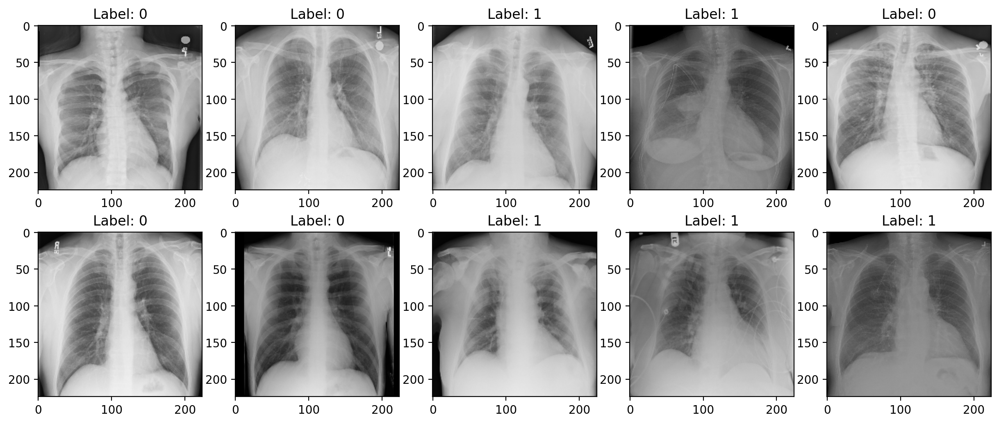

In [ ]:
import matplotlib.pyplot as plt

# get the indices of images in the first cluster
cluster2_indices = np.where(cluster_labels == 1)[0]

# plot the images in the first cluster
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(cluster2_indices[:10]):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

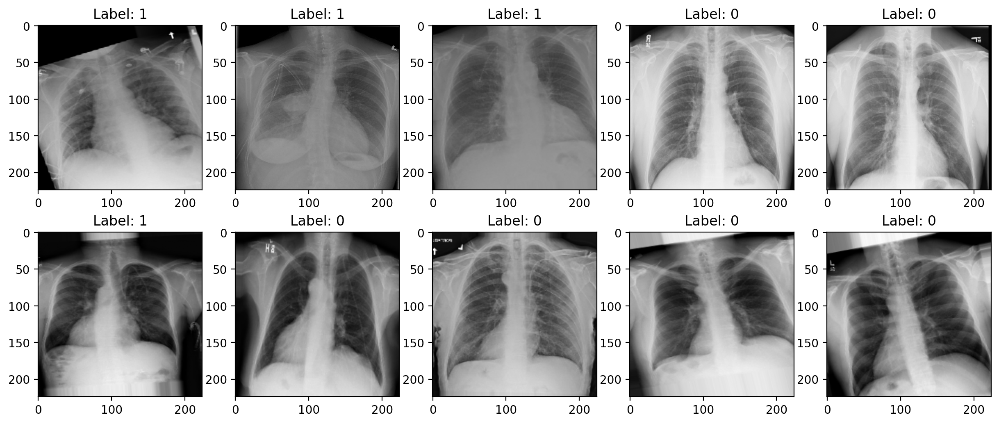

In [ ]:
# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster2_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

In [ ]:
# count the number of images labeled 1 in cluster 2
c2_num_label_1 = np.count_nonzero(y_aug[cluster2_indices] == 1)

print(f"There are {c2_num_label_1} images labeled 1 in cluster 2.")

c2_num_label_0 = np.count_nonzero(y_aug[cluster2_indices] == 0)

print(f"There are {c2_num_label_0} images labeled 0 in cluster 2.")

There are 42 images labeled 1 in cluster 2.
There are 66 images labeled 0 in cluster 2.


In [ ]:
distances = pdist(features_df.iloc[cluster2_indices])
distance_matrix = squareform(distances)

# calculate average intra-cluster distance
intra_cluster_distance = np.mean(distance_matrix)

print("Average intra-cluster distance:", intra_cluster_distance)

Average intra-cluster distance: 212.0589252682604


In [ ]:
cluster2_indices

array([ 13,  17,  19,  22,  23,  26,  36,  39,  40,  51,  54,  61,  69,
        70,  72,  80,  93,  96, 100, 104, 106, 109, 114, 123, 124, 126,
       129, 137, 141, 149, 155, 158, 165, 174, 175, 181, 185, 186, 187,
       196, 197, 202, 205, 207, 213, 215, 216, 218, 220, 224, 227, 242,
       248, 250, 251, 252, 259, 261, 264, 266, 276, 278, 280, 282, 284,
       286, 288, 297, 314, 317, 318, 321, 325, 326, 329, 331, 334, 339,
       346, 347, 348, 354, 356, 362, 374, 376, 378, 380, 383, 387, 390,
       399, 400, 402, 406, 412, 414, 419, 431, 432, 435, 437, 438, 443,
       444, 445, 447, 449])

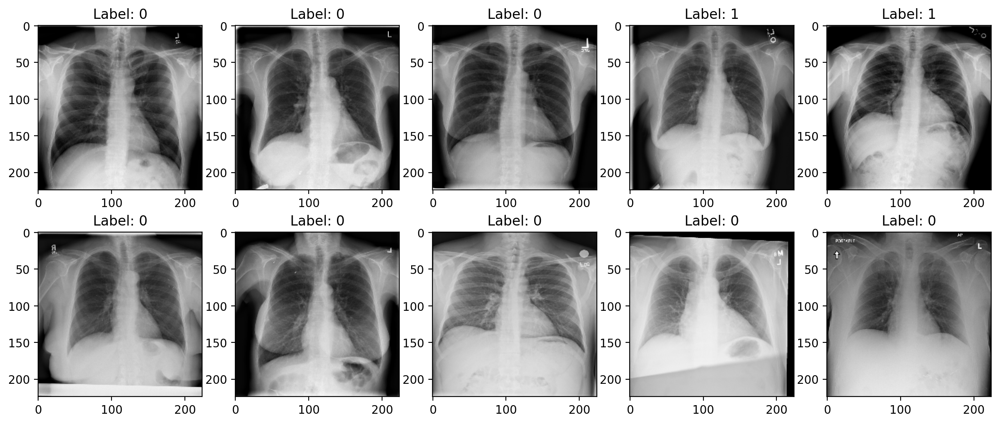

In [ ]:
import matplotlib.pyplot as plt

# get the indices of images in the first cluster
cluster3_indices = np.where(cluster_labels == 2)[0]

# plot the images in the first cluster
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(cluster3_indices[:10]):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

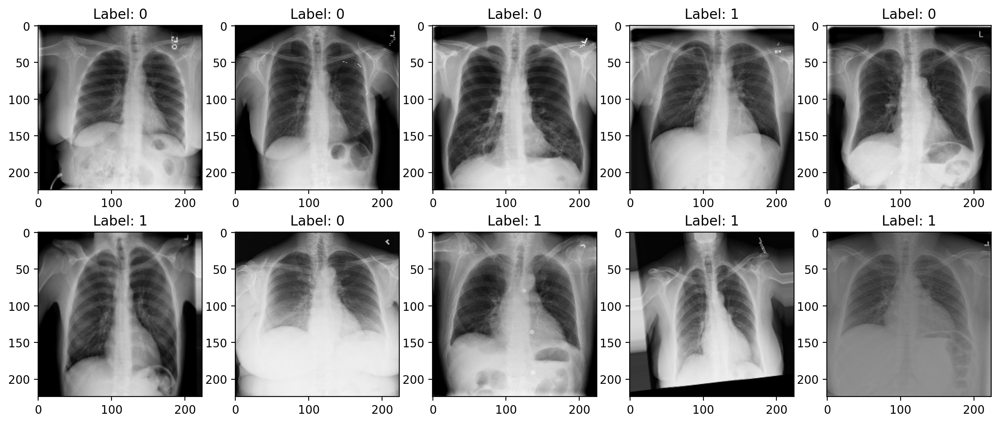

In [ ]:
# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster3_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

In [ ]:
c3_num_label_1 = np.count_nonzero(y_aug[cluster3_indices] == 1)

print(f"There are {c3_num_label_1} images labeled 1 in cluster 3.")

c3_num_label_0 = np.count_nonzero(y_aug[cluster3_indices] == 0)

print(f"There are {c3_num_label_0} images labeled 0 in cluster 3.")

There are 53 images labeled 1 in cluster 3.
There are 60 images labeled 0 in cluster 3.


In [ ]:
from scipy.spatial.distance import pdist, squareform
# calculate pairwise distance matrix
distances = pdist(features_df.iloc[cluster3_indices])
distance_matrix = squareform(distances)

# calculate average intra-cluster distance
intra_cluster_distance = np.mean(distance_matrix)

print("Average intra-cluster distance:", intra_cluster_distance)

Average intra-cluster distance: 224.10026019606383


In [ ]:
cluster3_indices

array([  2,   4,   5,   6,   9,  12,  16,  18,  21,  24,  29,  31,  34,
        37,  38,  41,  43,  45,  46,  47,  48,  49,  55,  57,  59,  60,
        62,  63,  64,  67,  73,  75,  76,  81,  82,  84,  86,  88,  89,
        92,  94,  97,  99, 102, 103, 108, 110, 111, 112, 117, 118, 119,
       120, 121, 128, 130, 131, 132, 136, 138, 140, 142, 146, 147, 148,
       150, 151, 152, 153, 154, 161, 162, 169, 171, 177, 178, 184, 188,
       189, 192, 194, 195, 199, 200, 201, 203, 208, 210, 211, 212, 214,
       217, 219, 221, 222, 223, 238, 270, 273, 274, 311, 327, 328, 353,
       355, 367, 371, 375, 409, 424, 426, 436, 446])

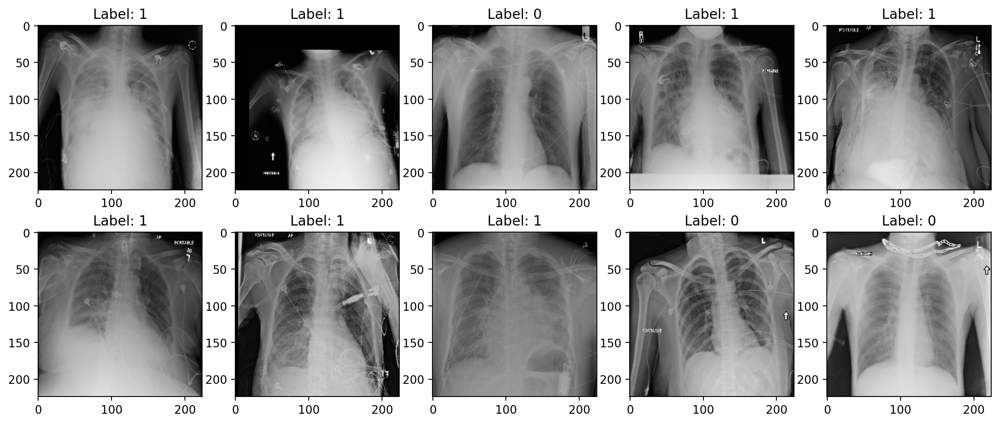

In [ ]:
import matplotlib.pyplot as plt

# get the indices of images in the first cluster
cluster4_indices = np.where(cluster_labels == 3)[0]

# plot the images in the first cluster
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(cluster4_indices[:10]):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

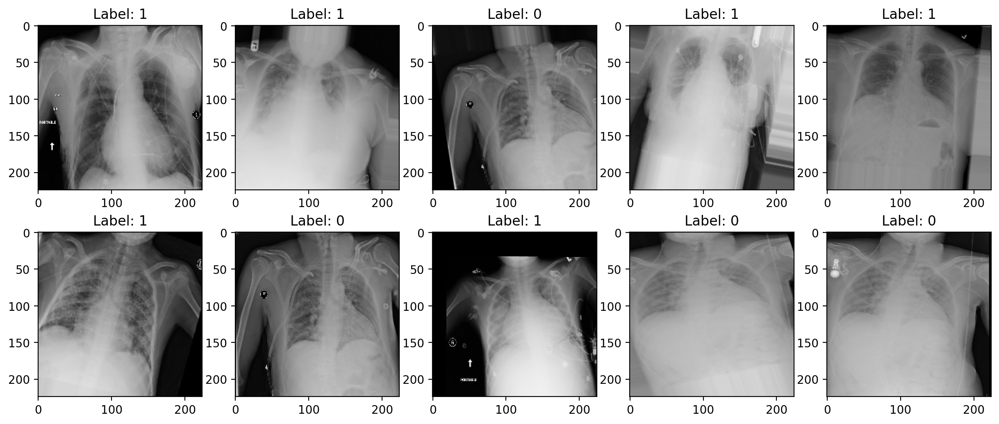

In [ ]:
# randomly select 10 indices from the cluster
random_indices = random.sample(list(cluster4_indices), 10)

# plot the randomly selected images
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axs = axs.ravel()
for i, index in enumerate(random_indices):
    axs[i].imshow(x_aug[index]/255)
    axs[i].set_title(f"Label: {y_aug[index]}")
plt.show()

In [ ]:
# count the number of images labeled 1 in cluster 2
c4_num_label_1 = np.count_nonzero(y_aug[cluster4_indices] == 1)

print(f"There are {c4_num_label_1} images labeled 1 in cluster 4.")

c4_num_label_0 = np.count_nonzero(y_aug[cluster4_indices] == 0)

print(f"There are {c4_num_label_0} images labeled 0 in cluster 4.")

There are 87 images labeled 1 in cluster 4.
There are 46 images labeled 0 in cluster 4.


In [ ]:
distances = pdist(features_df.iloc[cluster4_indices])
distance_matrix = squareform(distances)

# calculate average intra-cluster distance
intra_cluster_distance = np.mean(distance_matrix)

print("Average intra-cluster distance:", intra_cluster_distance)

Average intra-cluster distance: 238.92623433447744


In [ ]:
cluster4_indices

array([  0,   1,   3,   8,  10,  15,  20,  27,  28,  30,  32,  33,  35,
        42,  44,  52,  53,  56,  58,  65,  66,  68,  71,  74,  77,  78,
        79,  83,  85,  87,  90,  91,  95,  98, 101, 105, 107, 115, 116,
       125, 127, 133, 134, 135, 143, 144, 145, 156, 159, 160, 163, 164,
       166, 167, 168, 170, 172, 173, 179, 180, 182, 183, 190, 191, 193,
       198, 204, 206, 209, 225, 226, 228, 233, 235, 240, 245, 247, 253,
       255, 257, 258, 260, 263, 267, 277, 281, 283, 291, 293, 294, 295,
       299, 302, 304, 308, 310, 312, 316, 323, 330, 332, 340, 341, 350,
       351, 352, 358, 359, 360, 368, 370, 381, 384, 385, 388, 389, 391,
       392, 393, 395, 397, 398, 405, 407, 408, 415, 416, 418, 423, 427,
       429, 434, 441])

In [ ]:
centroids = kmeans.cluster_centers_

# Calculate the distances between each pair of centroids
distances = []
for i in range(4):
    for j in range(i+1, 4):
        centroid1 = centroids[i]
        centroid2 = centroids[j]
        distance = np.linalg.norm(centroid1-centroid2)
        distances.append(distance)

# Print the distances
print(distances)

[69.48572, 73.94785, 72.83464, 71.77756, 65.27274, 97.08567]


In [ ]:
cluster_map = pd.DataFrame()
cluster_map['data_index'] = test_features_df.index.values
cluster_map['cluster'] = test_cluster_labels
c0_test = cluster_map[cluster_map.cluster == 0]
print(len(c0_test))
y0_test = np.array([y_testall[i] for i in c0_test.data_index])
print(len(y0_test))

3
3


In [ ]:
x0_test = np.array([x_testall[i] for i in c0_test.data_index])
x0_test.shape

(3, 224, 224, 3)

In [ ]:
test_loss, test_acc = basemodel.evaluate(x0_test, y0_test, batch_size=1)

3/3 [==============================] - 0s 124ms/step - loss: 1.0491 - accuracy: 0.6667


In [ ]:
c1_test = cluster_map[cluster_map.cluster == 1]
print(len(c1_test))
y1_test = np.array([y_testall[i] for i in c1_test.data_index])
print(len(y1_test))
x1_test = np.array([x_testall[i] for i in c1_test.data_index])
x1_test.shape

16
16


(16, 224, 224, 3)

In [ ]:
test_loss, test_acc = basemodel.evaluate(x1_test, y1_test, batch_size=1)

16/16 [==============================] - 2s 125ms/step - loss: 0.4933 - accuracy: 0.9375


In [ ]:
c2_test = cluster_map[cluster_map.cluster == 2]
print(len(c2_test))
y2_test = np.array([y_testall[i] for i in c2_test.data_index])
print(len(y2_test))
x2_test = np.array([x_testall[i] for i in c2_test.data_index])
x2_test.shape

22
22


(22, 224, 224, 3)

In [ ]:
test_loss, test_acc = basemodel.evaluate(x2_test, y2_test, batch_size=1)

22/22 [==============================] - 2s 98ms/step - loss: 1.2299 - accuracy: 0.7727


In [ ]:
c3_test = cluster_map[cluster_map.cluster == 3]
print(len(c3_test))
y3_test = np.array([y_testall[i] for i in c3_test.data_index])
print(len(y3_test))
x3_test = np.array([x_testall[i] for i in c3_test.data_index])
x3_test.shape

16
16


(16, 224, 224, 3)

In [ ]:
test_loss, test_acc = basemodel.evaluate(x3_test, y3_test, batch_size=1)

16/16 [==============================] - 1s 78ms/step - loss: 0.9402 - accuracy: 0.8125


In [ ]:
cluster1_features = features_df[cluster_labels == 0]
cluster2_features = features_df[cluster_labels == 1]
cluster3_features = features_df[cluster_labels == 2]
cluster4_features = features_df[cluster_labels == 3]
print(cluster1_features.shape)
print(cluster2_features.shape)
print(cluster3_features.shape)
print(cluster4_features.shape)

(96, 62720)
(108, 62720)
(113, 62720)
(133, 62720)


In [ ]:
cluster_map = pd.DataFrame()
cluster_map['data_index'] = features_df.index.values
cluster_map['cluster'] = cluster_labels
c0 = cluster_map[cluster_map.cluster == 0]
print(len(c0))
y0 = np.array([y_aug[i] for i in c0.data_index])
print(len(y0))

c1 = cluster_map[cluster_map.cluster == 1]
y1 = np.array([y_aug[i] for i in c1.data_index])
print(len(y1))

c2 = cluster_map[cluster_map.cluster == 2]
y2 = np.array([y_aug[i] for i in c2.data_index])
print(len(y2))

c3 = cluster_map[cluster_map.cluster == 3]
y3 = np.array([y_aug[i] for i in c3.data_index])
len(y3)



96
96
108
113


133

In [ ]:
y0

array([0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0])

In [ ]:
y1

array([0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1])

In [ ]:
y2

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 0])

In [ ]:
y3

array([1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0])

In [ ]:
x0 = np.array([x_aug[i] for i in c0.data_index])
y0 = np.array([y_aug[i] for i in c0.data_index])
x0.shape

(96, 224, 224, 3)

In [ ]:
x1 = np.array([x_aug[i] for i in c1.data_index])
y1 = np.array([y_aug[i] for i in c1.data_index])
x1.shape

(108, 224, 224, 3)

In [ ]:
x2 = np.array([x_aug[i] for i in c2.data_index])
y2 = np.array([y_aug[i] for i in c2.data_index])
x2.shape

(113, 224, 224, 3)

In [ ]:
x3 = np.array([x_aug[i] for i in c3.data_index])
y3 = np.array([y_aug[i] for i in c3.data_index])
x3.shape

(133, 224, 224, 3)

In [ ]:
from keras.applications.efficientnet import EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

for layer in efficientnet.layers:
    layer.trainable = False

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Flatten, Dense

model1 = Sequential()
model1.add(efficientnet)
model1.add(Flatten())
model1.add(Dense(1,activation="sigmoid"))
model1.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])

from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("c0_efficientnet.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor="val_accuracy", patience=10, verbose=1, mode='auto', restore_best_weights=True)
history3 = model1.fit(x0, y0, batch_size=8, epochs=30, validation_data=(x_testall, y_testall), verbose=1, callbacks = [checkpoint, earlystop])

Epoch 1/30
12/12 [==============================] - ETA: 0s - loss: 2.1303 - accuracy: 0.5312
Epoch 1: val_accuracy improved from -inf to 0.49123, saving model to c0_efficientnet.h5
12/12 [==============================] - 23s 1s/step - loss: 2.1303 - accuracy: 0.5312 - val_loss: 1.7455 - val_accuracy: 0.4912
Epoch 2/30
12/12 [==============================] - ETA: 0s - loss: 0.3903 - accuracy: 0.8750
Epoch 2: val_accuracy improved from 0.49123 to 0.64912, saving model to c0_efficientnet.h5
12/12 [==============================] - 12s 1s/step - loss: 0.3903 - accuracy: 0.8750 - val_loss: 1.3982 - val_accuracy: 0.6491
Epoch 3/30
12/12 [==============================] - ETA: 0s - loss: 0.1282 - accuracy: 0.9375
Epoch 3: val_accuracy improved from 0.64912 to 0.70175, saving model to c0_efficientnet.h5
12/12 [==============================] - 13s 1s/step - loss: 0.1282 - accuracy: 0.9375 - val_loss: 1.8829 - val_accuracy: 0.7018
Epoch 4/30
12/12 [==============================] - ETA: 0s -

2/2 [==============================] - 9s 3s/step
Accuracy: 73.68%
AUC Score: 0.75
Sensitivity: 51.72%
Specificity: 96.43%


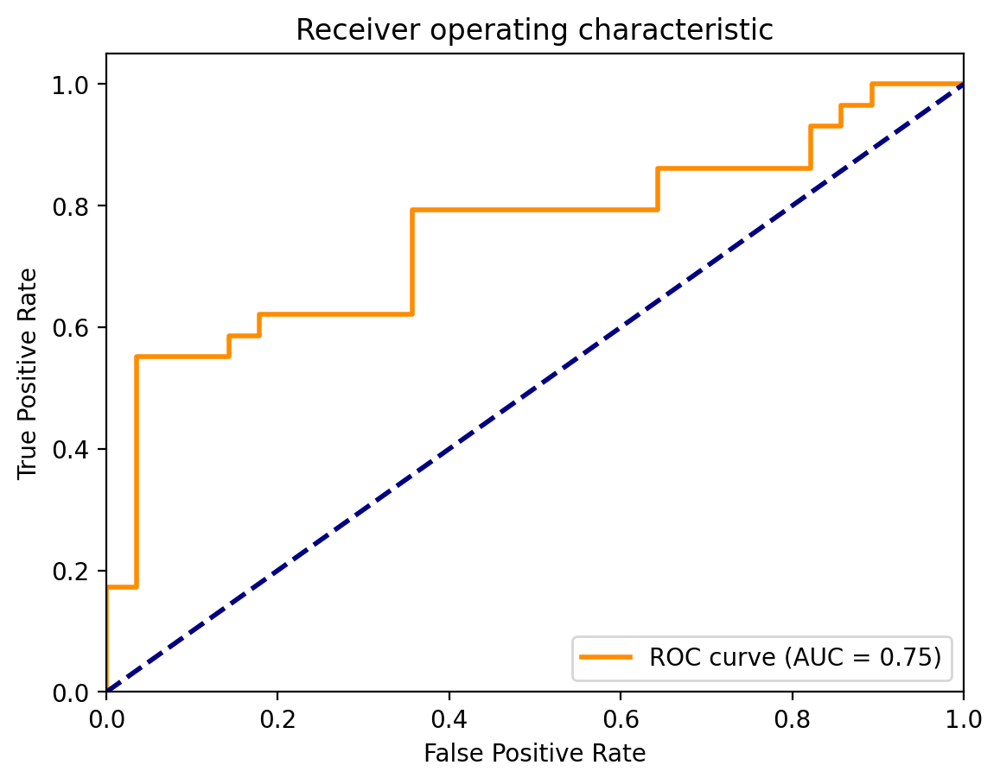

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model1.predict(x_testall)

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_testall, predictions)

# Compute the AUC score
auc_score = roc_auc_score(y_testall, predictions)

# Print the performance metrics
print("Accuracy: {:.2f}%".format(accuracy_score(y_testall, np.round(predictions)) * 100))
print("AUC Score: {:.2f}".format(auc_score))
tn, fp, fn, tp = confusion_matrix(y_testall, np.round(predictions)).ravel()
print("Sensitivity: {:.2f}%".format(tp / (tp + fn) * 100))
print("Specificity: {:.2f}%".format(tn / (tn + fp) * 100))

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from keras.applications.efficientnet import EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

for layer in efficientnet.layers:
    layer.trainable = False

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Flatten, Dense

model2 = Sequential()
model2.add(efficientnet)
model2.add(Flatten())
model2.add(Dense(1,activation="sigmoid"))
model2.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])

from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("c2_efficientnet.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor="val_accuracy", patience=10, verbose=1, mode='auto', restore_best_weights=True)
history4 = model2.fit(x1, y1, batch_size=8, epochs=30, validation_data=(x_testall, y_testall), verbose=1, callbacks = [checkpoint, earlystop])

Epoch 1/30
14/14 [==============================] - ETA: 0s - loss: 1.7111 - accuracy: 0.6204
Epoch 1: val_accuracy improved from -inf to 0.63158, saving model to c2_efficientnet.h5
14/14 [==============================] - 32s 2s/step - loss: 1.7111 - accuracy: 0.6204 - val_loss: 1.6319 - val_accuracy: 0.6316
Epoch 2/30
14/14 [==============================] - ETA: 0s - loss: 0.3548 - accuracy: 0.9074
Epoch 2: val_accuracy improved from 0.63158 to 0.68421, saving model to c2_efficientnet.h5
14/14 [==============================] - 12s 905ms/step - loss: 0.3548 - accuracy: 0.9074 - val_loss: 1.1497 - val_accuracy: 0.6842
Epoch 3/30
14/14 [==============================] - ETA: 0s - loss: 0.1130 - accuracy: 0.9537
Epoch 3: val_accuracy did not improve from 0.68421
14/14 [==============================] - 13s 918ms/step - loss: 0.1130 - accuracy: 0.9537 - val_loss: 0.9274 - val_accuracy: 0.6842
Epoch 4/30
14/14 [==============================] - ETA: 0s - loss: 0.0462 - accuracy: 0.9815
E

2/2 [==============================] - 8s 3s/step
Accuracy: 80.70%
AUC Score: 0.80
Sensitivity: 89.66%
Specificity: 71.43%


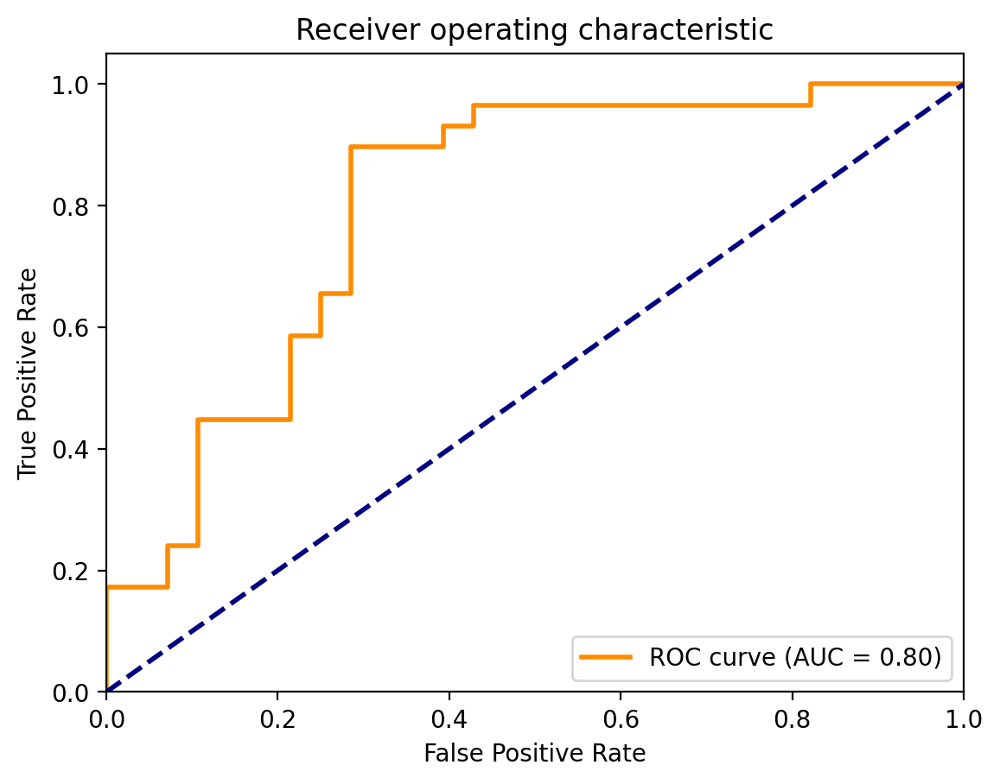

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model2.predict(x_testall)

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_testall, predictions)

# Compute the AUC score
auc_score = roc_auc_score(y_testall, predictions)

# Print the performance metrics
print("Accuracy: {:.2f}%".format(accuracy_score(y_testall, np.round(predictions)) * 100))
print("AUC Score: {:.2f}".format(auc_score))
tn, fp, fn, tp = confusion_matrix(y_testall, np.round(predictions)).ravel()
print("Sensitivity: {:.2f}%".format(tp / (tp + fn) * 100))
print("Specificity: {:.2f}%".format(tn / (tn + fp) * 100))

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from keras.applications.efficientnet import EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

for layer in efficientnet.layers:
    layer.trainable = False

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Flatten, Dense

model3 = Sequential()
model3.add(efficientnet)
model3.add(Flatten())
model3.add(Dense(1,activation="sigmoid"))
model3.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])

from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("c3_efficientnet.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor="val_accuracy", patience=10, verbose=1, mode='auto', restore_best_weights=True)
history5 = model3.fit(x2, y2, batch_size=8, epochs=30, validation_data=(x_testall, y_testall), verbose=1, callbacks = [checkpoint, earlystop])

Epoch 1/30
15/15 [==============================] - ETA: 0s - loss: 2.6697 - accuracy: 0.5398
Epoch 1: val_accuracy improved from -inf to 0.56140, saving model to c3_efficientnet.h5
15/15 [==============================] - 25s 1s/step - loss: 2.6697 - accuracy: 0.5398 - val_loss: 1.4443 - val_accuracy: 0.5614
Epoch 2/30
15/15 [==============================] - ETA: 0s - loss: 0.6627 - accuracy: 0.8584
Epoch 2: val_accuracy improved from 0.56140 to 0.63158, saving model to c3_efficientnet.h5
15/15 [==============================] - 13s 863ms/step - loss: 0.6627 - accuracy: 0.8584 - val_loss: 1.2398 - val_accuracy: 0.6316
Epoch 3/30
15/15 [==============================] - ETA: 0s - loss: 0.1919 - accuracy: 0.9469
Epoch 3: val_accuracy improved from 0.63158 to 0.71930, saving model to c3_efficientnet.h5
15/15 [==============================] - 15s 1s/step - loss: 0.1919 - accuracy: 0.9469 - val_loss: 0.8670 - val_accuracy: 0.7193
Epoch 4/30
15/15 [==============================] - ETA: 0

2/2 [==============================] - 8s 3s/step
Accuracy: 77.19%
AUC Score: 0.79
Sensitivity: 89.66%
Specificity: 64.29%


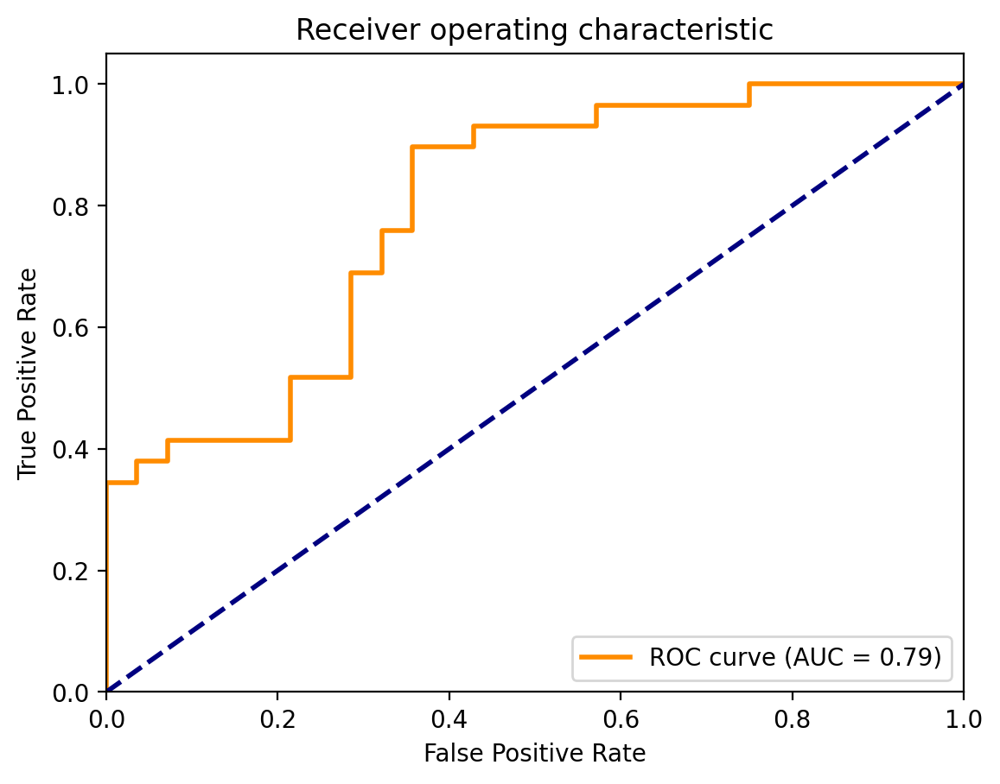

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model3.predict(x_testall)

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_testall, predictions)

# Compute the AUC score
auc_score = roc_auc_score(y_testall, predictions)

# Print the performance metrics
print("Accuracy: {:.2f}%".format(accuracy_score(y_testall, np.round(predictions)) * 100))
print("AUC Score: {:.2f}".format(auc_score))
tn, fp, fn, tp = confusion_matrix(y_testall, np.round(predictions)).ravel()
print("Sensitivity: {:.2f}%".format(tp / (tp + fn) * 100))
print("Specificity: {:.2f}%".format(tn / (tn + fp) * 100))

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from keras.applications.efficientnet import EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

for layer in efficientnet.layers:
    layer.trainable = False

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Flatten, Dense

model4 = Sequential()
model4.add(efficientnet)
model4.add(Flatten())
model4.add(Dense(1,activation="sigmoid"))
model4.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])

from keras.callbacks import ModelCheckpoint, EarlyStopping
checkpoint = ModelCheckpoint("c4_efficientnet.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor="val_accuracy", patience=10, verbose=1, mode='auto', restore_best_weights=True)
history6 = model4.fit(x3, y3, batch_size=8, epochs=30, validation_data=(x_testall, y_testall), verbose=1, callbacks = [checkpoint, earlystop])

Epoch 1/30
17/17 [==============================] - ETA: 0s - loss: 1.5962 - accuracy: 0.5865
Epoch 1: val_accuracy improved from -inf to 0.61404, saving model to c4_efficientnet.h5
17/17 [==============================] - 26s 1s/step - loss: 1.5962 - accuracy: 0.5865 - val_loss: 2.0498 - val_accuracy: 0.6140
Epoch 2/30
17/17 [==============================] - ETA: 0s - loss: 0.5699 - accuracy: 0.8647
Epoch 2: val_accuracy improved from 0.61404 to 0.63158, saving model to c4_efficientnet.h5
17/17 [==============================] - 16s 991ms/step - loss: 0.5699 - accuracy: 0.8647 - val_loss: 1.8646 - val_accuracy: 0.6316
Epoch 3/30
17/17 [==============================] - ETA: 0s - loss: 0.1502 - accuracy: 0.9774
Epoch 3: val_accuracy did not improve from 0.63158
17/17 [==============================] - 16s 945ms/step - loss: 0.1502 - accuracy: 0.9774 - val_loss: 4.6978 - val_accuracy: 0.4912
Epoch 4/30
17/17 [==============================] - ETA: 0s - loss: 0.0961 - accuracy: 0.9699
E

2/2 [==============================] - 6s 2s/step
Accuracy: 56.14%
AUC Score: 0.67
Sensitivity: 96.55%
Specificity: 14.29%


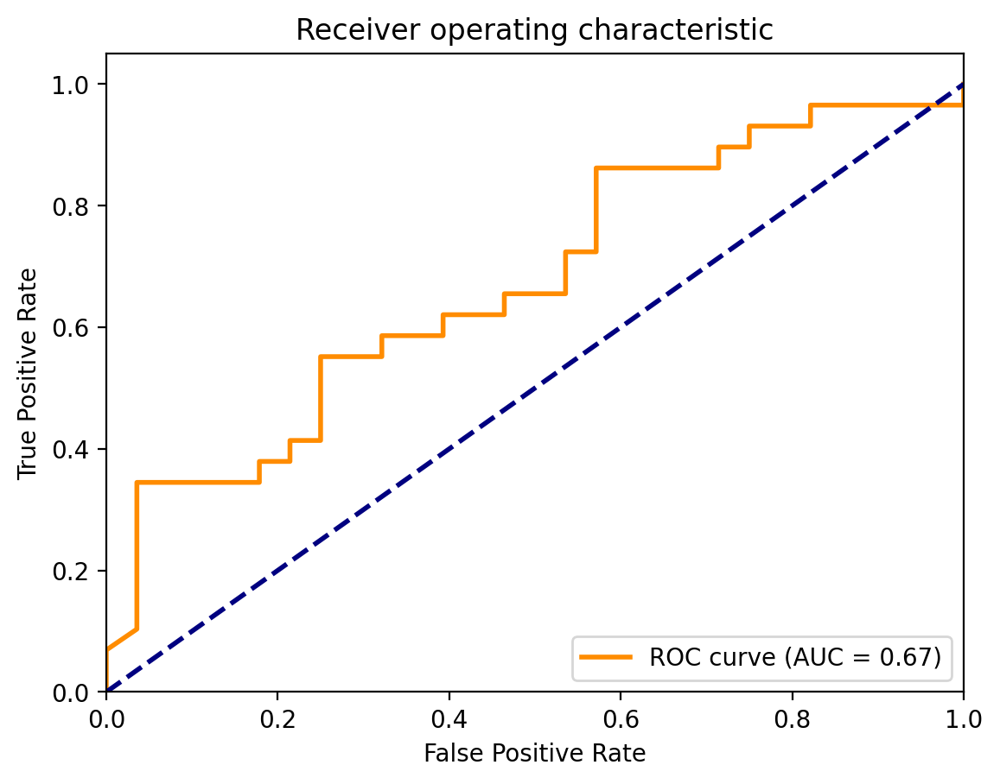

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model4.predict(x_testall)

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_testall, predictions)

# Compute the AUC score
auc_score = roc_auc_score(y_testall, predictions)

# Print the performance metrics
print("Accuracy: {:.2f}%".format(accuracy_score(y_testall, np.round(predictions)) * 100))
print("AUC Score: {:.2f}".format(auc_score))
tn, fp, fn, tp = confusion_matrix(y_testall, np.round(predictions)).ravel()
print("Sensitivity: {:.2f}%".format(tp / (tp + fn) * 100))
print("Specificity: {:.2f}%".format(tn / (tn + fp) * 100))

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()